## Read file

In [874]:
import numpy as np
import os
import pandas as pd
from math import floor

motion_type = "stationary"
motion_name = "2"
vicon_name = "stationary_2"

# motion_part = "arm"
# com_port = "24"

motion_part = "leg"
com_port = "22"

imu_file = "D:/碩班 許盛軒_research/vicon dataset 2/imu/"+motion_type+"/"+motion_name+"/data_COM"+com_port+".csv"
mag_offset_file = "D:/碩班 許盛軒_research/vicon dataset 2/imu/"+motion_type+"/"+motion_name+"/offset_COM"+com_port+".csv"
vicon_file = "D:/碩班 許盛軒_research/vicon dataset 2/vicon data trim/"+motion_type+"/"+vicon_name+".csv"
syn_path = "D:/碩班 許盛軒_research/vicon dataset 2/syn/"+motion_type+"/"+motion_name+"_"+motion_part+"/"

do_correct_offset = True
correct_mag_offset_file = "D:/碩班 許盛軒_research/vicon dataset 2/offset/offset_"+com_port+"/offset_COM"+com_port+".csv"

imu_df = pd.read_csv(imu_file).values
imu_acc = imu_df[:,6:9]
imu_gyr = imu_df[:,9:12]
imu_mag_raw = imu_df[:,12:15]
imu_time = imu_df[:,15]
imu_duration = (imu_time[-1] - imu_time[0]) * 1000
print(f"imu start: {imu_time[0]} s")
print(f"imu end: {imu_time[-1]} s")
print(f"imu duration: {imu_duration} ms")
print(f"imu freq: {imu_time.shape[0]/imu_duration*1000} Hz")
print(f"data length: {imu_time.shape[0]}")

# vicon_df = pd.read_csv(vicon_file).values
vicon_df = pd.read_csv(vicon_file, skiprows=4).values[:,2:-4]

print(f"vicon shape: {vicon_df.shape}")
vicon_points = np.hsplit(vicon_df[:,:floor(vicon_df.shape[1]/3)*3],floor(vicon_df.shape[1]/3))
vive_duration = vicon_df.shape[0] * 10

print(f"vicon duration: {vive_duration} ms")

os.makedirs(syn_path,exist_ok=True)

imu_mag = np.array(imu_mag_raw)

# adjust mag to correct offset and scale
if do_correct_offset:
    offset_array = np.loadtxt(mag_offset_file, delimiter=",")
    correct_offset_array = np.loadtxt(correct_mag_offset_file, delimiter=",")
    mag_offset = np.array([0.0,0.0,0.0])
    mag_scale = np.array([1.0,1.0,1.0])
    correct_mag_offset = np.array([0.0,0.0,0.0])
    correct_mag_scale = np.array([1.0,1.0,1.0])

    # scale 1 if no scale is provided
    mag_offset = offset_array[0:3]
    correct_mag_offset = correct_offset_array[0:3]

    if offset_array.shape[0] >= 6:
        mag_scale = offset_array[3:6]

    if correct_offset_array.shape[0] >= 6:
        correct_mag_scale = correct_offset_array[3:6]

    print('original offset:', mag_offset ,'/', mag_scale)
    print('correct offset: ',correct_mag_offset, '/', correct_mag_scale)

    imu_mag[:,0] = ((imu_mag[:,0] / mag_scale[0]) + mag_offset[0] - correct_mag_offset[0]) * correct_mag_scale[0]
    imu_mag[:,1] = ((imu_mag[:,1] / mag_scale[1]) + mag_offset[1] - correct_mag_offset[1]) * correct_mag_scale[1]
    imu_mag[:,2] = ((imu_mag[:,2] / mag_scale[2]) + mag_offset[2] - correct_mag_offset[2]) * correct_mag_scale[2]


np.set_printoptions(threshold=1000)

imu start: 1705381491.1945274 s
imu end: 1705381671.2438529 s
imu duration: 180049.325466156 ms
imu freq: 99.67824069062404 Hz
data length: 17947
vicon shape: (18265, 34)
vicon duration: 182650 ms
original offset: [  88.   194.  -258.5] / [1.08240397 0.93622722 0.99204997]
correct offset:  [  88.   194.  -258.5] / [1.08240397 0.93622722 0.99204997]


In [875]:
%matplotlib widget

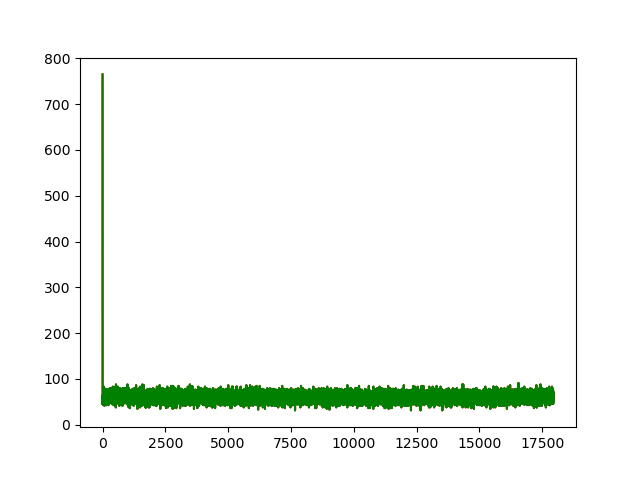

In [876]:
import matplotlib.pyplot as plt
x = range(imu_mag.shape[0])
yx = imu_mag[:,0]
yy = imu_mag_raw[:,0]
# yz = ahrs_acc[:,2]

plt.clf()
plt.plot(x, yx, 'r')   # red: processed mag
plt.plot(x, yy, 'g')   # green: raw mag
# plt.plot(x, yz, 'b')   # 

plt.show()

# find vicon position and quat

11
(18265, 3)


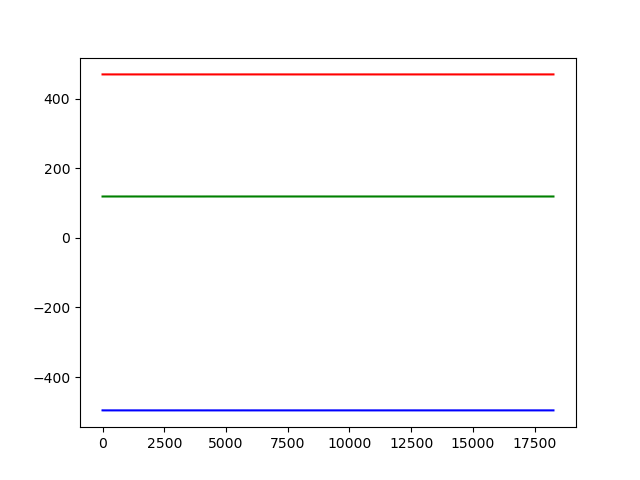

In [877]:
print(len(vicon_points))
print(vicon_points[0].shape)
x = range(vicon_points[0].shape[0])
yx = vicon_points[0][:,0]
yy = vicon_points[0][:,1]
yz = vicon_points[0][:,2]

plt.clf()
plt.plot(x, yx, 'r')   # red line without marker
plt.plot(x, yy, 'g')   # red line without marker
plt.plot(x, yz, 'b')   # red line without marker
plt.show()

In [878]:
# initial point

import plotly.graph_objs as go

traces = []
for i,p in enumerate(vicon_points):
    # trace = go.Scatter3d(x=p[0:1,0], y=p[0:1,1], z=p[0:1,2],  name=f"p{i}")
    trace = go.Scatter3d(x=p[0:10,0], y=p[0:10,1], z=p[0:10,2],  name=f"p{i}")
    # trace = go.Scatter3d(x=p[500:1000,0], y=p[500:1000,1], z=p[500:1000,2],  name=f"p{i}")
    # trace = go.Scatter3d(x=p[:,0], y=p[:,1], z=p[:,2], mode='lines', name=f"p{i}")
    traces.append(trace)
    if i == 9:
        break


fig = go.Figure(traces)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)

fig.update_scenes(
    aspectmode='data'
)

fig.show()

In [879]:
# first 10 points for orientation

import plotly.graph_objs as go

traces = []
for i,p in enumerate(vicon_points):
    # trace = go.Scatter3d(x=p[0:1,0], y=p[0:1,1], z=p[0:1,2],  name=f"p{i}")
    # trace = go.Scatter3d(x=p[0:100,0], y=p[0:100,1], z=p[0:100,2],  name=f"p{i}")
    # trace = go.Scatter3d(x=p[500:1000,0], y=p[500:1000,1], z=p[500:1000,2],  name=f"p{i}")
    trace = go.Scatter3d(x=p[:,0], y=p[:,1], z=p[:,2], mode='lines', name=f"p{i}")
    traces.append(trace)
    if i == 9:
        break


fig = go.Figure(traces)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)

fig.update_scenes(
    aspectmode='data'
)

fig.show()

In [880]:
# import plotly.graph_objs as go

# traces = []
# p = vicon_points[0]
# # trace = go.Scatter3d(x=p[500:-500,0], y=p[500:-500,1], z=p[500:-500,2], mode='lines', name=f"p{i}")
# trace = go.Scatter3d(x=p[500:1000,0], y=p[500:1000,1], z=p[500:1000,2], name=f"p0")
# trace2 = go.Scatter3d(x=p[500:1200,0], y=p[500:1200,1], z=p[500:1200,2], name=f"p1")
# traces.append(trace2)
# traces.append(trace)
# # if i == 3:
# #     break

# fig = go.Figure(traces)

# fig.update_layout(
#     autosize=True,
#     width=1000,
#     height=1000,
# )

# fig.update_scenes(
#     aspectmode='data'
# )

# fig.show()

In [881]:
# interpolation function and convert to meter
def p_interp (arr):
    # Making sequences for interp
    arri = np.array(arr)

    arrx = arri[:,0]
    ok = ~np.isnan(arrx)
    xp = ok.ravel().nonzero()[0]
    fp = arrx[~np.isnan(arrx)]
    x  = np.isnan(arrx).ravel().nonzero()[0]
    arrx[np.isnan(arrx)] = np.interp(x, xp, fp)

    arry = arri[:,1]
    ok = ~np.isnan(arry)
    xp = ok.ravel().nonzero()[0]
    fp = arry[~np.isnan(arry)]
    x  = np.isnan(arry).ravel().nonzero()[0]
    arry[np.isnan(arry)] = np.interp(x, xp, fp)

    arrz = arri[:,2]
    ok = ~np.isnan(arrz)
    xp = ok.ravel().nonzero()[0]
    fp = arrz[~np.isnan(arrz)]
    x  = np.isnan(arrz).ravel().nonzero()[0]
    arrz[np.isnan(arrz)] = np.interp(x, xp, fp)


    arri[:,0] = arrx
    arri[:,1] = arry
    arri[:,2] = arrz

    arri = arri/1000 # convert to meter

    return arri

In [882]:
# calculate center point and quaternion
import quaternion

# vicon_p1 = p_interp(vicon_points[0])
# vicon_p2 = p_interp(vicon_points[1])
# vicon_p3 = p_interp(vicon_points[2])
# vicon_p4 = p_interp(vicon_points[3])

vicon_p1 = p_interp(vicon_points[6])
vicon_p2 = p_interp(vicon_points[4])
vicon_p3 = p_interp(vicon_points[7])
vicon_p4 = p_interp(vicon_points[5])

# vicon_p1 = p_interp(vicon_points[1])
# vicon_p2 = p_interp(vicon_points[2])
# vicon_p3 = p_interp(vicon_points[3])
# vicon_p4 = p_interp(vicon_points[4])

# vicon_p1 = p_interp(vicon_points[6])
# vicon_p2 = p_interp(vicon_points[7])
# vicon_p3 = p_interp(vicon_points[8])
# vicon_p4 = p_interp(vicon_points[9])

# vicon_p1 = p_interp(vicon_points[8])
# vicon_p2 = p_interp(vicon_points[5])
# vicon_p3 = p_interp(vicon_points[9])
# vicon_p4 = p_interp(vicon_points[6])

# vicon_p1 = p_interp(vicon_points[3])
# vicon_p2 = p_interp(vicon_points[0])
# vicon_p3 = p_interp(vicon_points[4])
# vicon_p4 = p_interp(vicon_points[1])

# vicon_p1 = p_interp(vicon_points[7])
# vicon_p2 = p_interp(vicon_points[5])
# vicon_p3 = p_interp(vicon_points[8])
# vicon_p4 = p_interp(vicon_points[6])

# p_c = np.mean([vicon_p1,vicon_p2,vicon_p3],axis=0) # mean of four tracker positions
# p_c = np.mean([vicon_p2,vicon_p3,vicon_p4],axis=0) # mean of four tracker positions
# p_c = np.mean([vicon_p1,vicon_p2,vicon_p4],axis=0) # mean of four tracker positions
# p_c = np.mean([vicon_p1,vicon_p3,vicon_p4],axis=0) # mean of four tracker positions
p_c = np.mean([vicon_p1,vicon_p2,vicon_p3,vicon_p4],axis=0) # mean of four tracker positions
l_x = (vicon_p1 + vicon_p2)/2 - p_c
# l_x = (vicon_p3 + vicon_p4)/2 - p_c
# l_y = (vicon_p1 + vicon_p3)/2 - p_c
l_y = (vicon_p2 + vicon_p4)/2 - p_c
l_z = np.cross(l_x, l_y)
rot = np.array([l_x.T, l_y.T, l_z.T]).T

vicon_qq = quaternion.from_rotation_matrix(rot)
vicon_q = quaternion.as_float_array(vicon_qq)

# plot vicon position

import plotly.graph_objs as go

# p0 = vicon_points[0] / 1000
p0 = vicon_p1
p1 = p_c[:,:]

trace_1 = go.Scatter3d(x=p0[:,0], y=p0[:,1], z=p0[:,2], mode='lines', name='point 0')
trace_2 = go.Scatter3d(x=p1[:,0], y=p1[:,1], z=p1[:,2], mode='lines', name='center point')

fig = go.Figure([
    trace_1, trace_2
])


fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)

fig.update_scenes(
    aspectmode='data'
)

fig.show()

## Run AHRS on IMU data

acc_arr [[0.         1.12451172 0.        ]
 [0.07714844 0.04833984 1.05615234]
 [0.07617188 0.046875   1.05029297]
 ...
 [0.07421875 0.05419922 1.05224609]
 [0.08447266 0.04833984 1.04980469]
 [0.078125   0.04833984 1.05029297]]
ahrs_acc [[ 2.64526828e+00  1.07078088e+01 -9.61379942e+00]
 [ 8.28782808e-01  5.34189254e-02  5.56061737e-01]
 [ 8.27294605e-01  5.21423927e-04  4.97518258e-01]
 ...
 [-3.65392447e-02  7.77756738e-02  5.51473627e-01]
 [-2.97420198e-02 -4.98737354e-02  5.32584013e-01]
 [ 6.91376428e-03 -2.90037307e-02  5.32672990e-01]]
ahrs_quat [[ 9.92638042e-01  8.89701991e-03 -5.07113912e-04 -1.20790328e-01]
 [ 9.91479366e-01  1.01942599e-02  1.36193926e-04 -1.29864257e-01]
 [ 9.90238689e-01  1.14561666e-02  7.43225722e-04 -1.38908396e-01]
 ...
 [ 7.66003991e-01 -4.62365178e-03 -4.72068615e-02 -6.41083474e-01]
 [ 7.61759353e-01 -5.67318592e-03 -4.49658678e-02 -6.46272833e-01]
 [ 7.57576146e-01 -5.93304225e-03 -4.19146146e-02 -6.51372664e-01]]
(17947, 3)
(17947, 4)


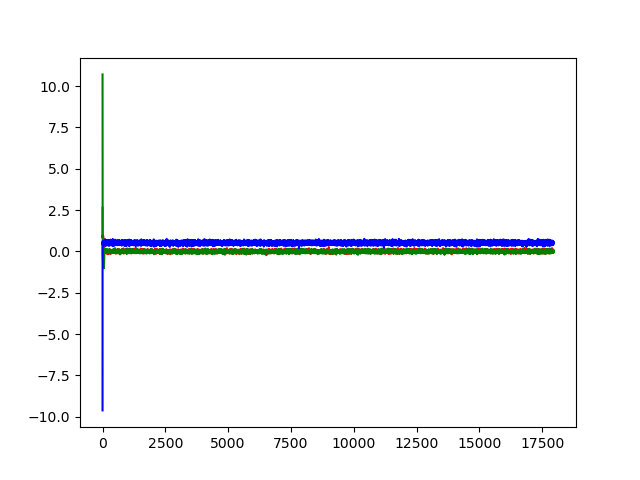

In [883]:
from madgwick import madgwickahrs
import numpy as np
import quaternion as qt

ahrs = madgwickahrs.MadgwickAHRS(0.01)

acc_arr = np.array(imu_acc)
ahrs_acc = np.array(acc_arr)
ahrs_gyr = np.array(imu_gyr)
ahrs_mag = np.array(imu_mag)
quat_list = []

# rescale mag offset

# Initial convergence
# for i in range(2000):
#     ahrs.update_imu([np.mean(ahrs_gyr[:,0]),np.mean(ahrs_gyr[:,1]),np.mean(ahrs_gyr[:,2])],[np.mean(acc_arr[:,0]),np.mean(acc_arr[:,1]),np.mean(acc_arr[:,2])])

# update 
for i,(gy,ac,mg) in enumerate(zip(ahrs_gyr, acc_arr, ahrs_mag)):
    gy_rad = np.deg2rad(gy)
    ahrs.update(gy_rad,ac,mg)
    # print(ahrs.quaternion.q)

    q =  qt.from_float_array(ahrs.quaternion.q)
    quat_list.append(ahrs.quaternion.q)
    ahrs_acc[i] = qt.rotate_vectors(q,acc_arr[i])
    ahrs_acc[i] *= 9.81
    ahrs_acc[i,2] -= 9.81

ahrs_quat = np.array(quat_list)

print('acc_arr',acc_arr)
print('ahrs_acc',ahrs_acc)    
print('ahrs_quat',ahrs_quat)

print(ahrs_acc.shape)
print(ahrs_quat.shape)

import matplotlib.pyplot as plt
x = range(ahrs_acc.shape[0])
yx = ahrs_acc[:,0]
yy = ahrs_acc[:,1]
yz = ahrs_acc[:,2]

plt.clf()
plt.plot(x, yx, 'r')   # red: ahrs acc x
plt.plot(x, yy, 'g')   # green: ahrs acc y
plt.plot(x, yz, 'b')   # blue: ahrs acc z

plt.show()


# Align imu and vive data

(17447, 3)
(17447, 4)


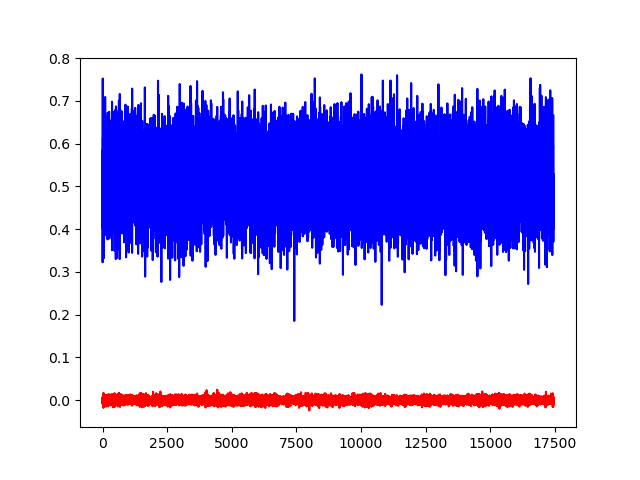

In [884]:
from scipy import signal

# less value: move curve to right
# more value: move curve to left

imu_shift = 400
vive_shift = 400
trim = -100

a_p = p_c
a_q = vicon_q

y_p = a_p[imu_shift:trim,:]
y_q = a_q[imu_shift:trim,:]
x_racc = ahrs_acc[vive_shift:trim,:]
x_rgyr = ahrs_gyr[vive_shift:trim,:]
x_mag =  ahrs_mag [vive_shift:trim,:]
x_q = ahrs_quat[vive_shift:trim,:]

if y_p.shape[0] > x_racc.shape[0]:
    y_p = y_p[:x_racc.shape[0],:]
    y_q = y_q[:x_racc.shape[0],:]
else:
    x_racc=x_racc[:y_p.shape[0],:]
    x_rgyr=x_rgyr[:y_p.shape[0],:]
    x_mag=x_mag[:y_p.shape[0],:]
    x_q=x_q[:y_p.shape[0],:]


print(y_p.shape)
print(y_q.shape)

x = range(x_racc.shape[0]-1)
yx = np.diff(y_p[:,2]) * 1000
yy = x_racc[:-1,2]  


# x = range(x_racc.shape[0]-2)
# yx = np.diff(np.diff(y_p[:,1])) * 5000
# yy = x_racc[:-2,1]  

plt.clf()
plt.plot(x, yx, 'r')   # red vicon pos
plt.plot(x, yy, 'b')   # blue imu acc
plt.show()


In [885]:
# plot center point

import plotly.graph_objs as go

p = y_p[:,:]

trace_1 = go.Scatter3d(x=p[:,0], y=p[:,1], z=p[:,2], mode='lines', name='Ground Truth')

fig = go.Figure([
    trace_1
])


fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)

fig.update_scenes(
    aspectmode='data'
)

fig.show()

In [886]:
from Tracking3D_dataset import load_dataset_9d_quat, force_quaternion_uniqueness
from Tracking3D_util import generate_trajectory_6d_quat
import plotly.graph_objs as go


def load_dataset_9d_quat_2(gyro_data, acc_data, mag_data, pos_data, ori_data, window_size=200, stride=10):
    init_p = pos_data[window_size//2 - stride//2, :]
    init_q = ori_data[window_size//2 - stride//2, :]

    #x = []
    x_gyro = []
    x_acc = []
    x_mag = []
    y_delta_p = []
    y_delta_q = []
    
    for idx in range(0, gyro_data.shape[0] - window_size - 1, stride):
        #x.append(gyro_acc_data[idx + 1 : idx + 1 + window_size, :])
        x_gyro.append(gyro_data[idx + 1 : idx + 1 + window_size, :])
        x_acc.append(acc_data[idx + 1 : idx + 1 + window_size, :])
        x_mag.append(mag_data[idx + 1 : idx + 1 + window_size, :])

        p_a = pos_data[idx + window_size//2 - stride//2, :]
        p_b = pos_data[idx + window_size//2 + stride//2  + stride%2, :]

        q_a = quaternion.from_float_array(ori_data[idx + window_size//2 - stride//2, :])
        q_b = quaternion.from_float_array(ori_data[idx + window_size//2 + stride//2 + stride%2, :])

        delta_p = np.matmul(quaternion.as_rotation_matrix(q_a).T, (p_b.T - p_a.T)).T

        delta_q = force_quaternion_uniqueness(q_a.conjugate() * q_b)

        y_delta_p.append(delta_p)
        y_delta_q.append(quaternion.as_float_array(delta_q))


    #x = np.reshape(x, (len(x), x[0].shape[0], x[0].shape[1]))
    x_gyro = np.reshape(x_gyro, (len(x_gyro), x_gyro[0].shape[0], x_gyro[0].shape[1]))
    x_acc = np.reshape(x_acc, (len(x_acc), x_acc[0].shape[0], x_acc[0].shape[1]))
    x_mag = np.reshape(x_mag, (len(x_mag), x_mag[0].shape[0], x_mag[0].shape[1]))
    y_delta_p = np.reshape(y_delta_p, (len(y_delta_p), y_delta_p[0].shape[0]))
    y_delta_q = np.reshape(y_delta_q, (len(y_delta_q), y_delta_q[0].shape[0]))

    #return x, [y_delta_p, y_delta_q], init_p, init_q
    return [x_gyro, x_acc, x_mag], [y_delta_p, y_delta_q], init_p, init_q

print(y_q.shape)

[cur_x_gyro, cur_x_acc, cur_x_mag], [cur_y_delta_p, cur_y_delta_q], init_p, init_q = load_dataset_9d_quat_2(x_rgyr,x_racc,x_mag,y_p,y_q,100,5)

print(cur_y_delta_q.shape)

gt_trajectory = generate_trajectory_6d_quat(init_p, init_q, cur_y_delta_p, cur_y_delta_q)




yx = gt_trajectory[:,0]
yy = gt_trajectory[:,1]
yz = gt_trajectory[:,2]


trace_1 = go.Scatter3d(x=yx, y=yy, z=yz, mode='lines', name='Ground Truth')

fig = go.Figure([
    trace_1
])


fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)

fig.update_scenes(
    aspectmode='data'
)

fig.show()

(17447, 4)
(3470, 4)


# save preprocessed data

In [887]:
print(x_racc.shape)
print(x_rgyr.shape)
print(x_mag.shape)

print(y_p.shape)
print(y_q.shape)

# time_array =  np.array(range(0,x_racc.shape[0]))*10
x_data = np.concatenate([x_racc,x_rgyr,x_mag],axis=1)
y_data = np.concatenate([y_p,y_q],axis=1)

np.savetxt(syn_path+"syn_imu.csv",   x_data,   delimiter=",", header="ax,ay,az,gx,gy,gz,mx,my,mz")
np.savetxt(syn_path+"syn_gt.csv",   y_data,   delimiter=",", header="px,py,pz,qx,qy,qz,qw")

print(f"saved imu file in {syn_path}syn_imu.csv")
print(f"saved gt file in {syn_path}syn_gt.csv")

(17447, 3)
(17447, 3)
(17447, 3)
(17447, 3)
(17447, 4)
saved imu file in D:/碩班 許盛軒_research/vicon dataset 2/syn/stationary/2_leg/syn_imu.csv
saved gt file in D:/碩班 許盛軒_research/vicon dataset 2/syn/stationary/2_leg/syn_gt.csv
